In [1]:
# imports
import sys
sys.path.append('../')

import folium
import matplotlib.pyplot as plt
import missingno
import pandas as pd
from pandas_profiling import ProfileReport
import helper_functions
import sweetviz as sv

%matplotlib inline

In [11]:
# set plotting params
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 24
plt.rcParams['axes.labelsize'] = 40
plt.rcParams['axes.titlesize'] = 40
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 24
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['legend.title_fontsize'] = 24
plt.rcParams['figure.titlesize'] = 80
plt.rcParams['legend.loc'] = 'center right'

In [3]:
# load data
DF_TITLE = 'Violent'

if DF_TITLE == 'Theft':
    PLOT_COLOR = (.1, .3, .5)
elif DF_TITLE == 'Vehicle':
    PLOT_COLOR = (.1, .5, .3)
elif DF_TITLE == 'Violent':
    PLOT_COLOR = (.5, .1, .1)
    
data_path = f'../data/{DF_TITLE.lower()}.csv'
df = pd.read_csv(data_path)

df['Call Received'] = pd.to_datetime(df['Call Received'])

In [4]:
helper_functions.preview_data(df)

(150374, 9)
     Event Number       Call Received  Complaint Number  Tencode  \
0  PD201500000273 2015-01-01 01:02:11               NaN       83   
1  PD201500000294 2015-01-01 01:08:37               NaN       57   
2  PD201500001460 2015-01-01 13:13:31               NaN       83   
3  PD201500001475 2015-01-01 13:20:26      2.015000e+10       57   
4  PD201500000340 2015-01-01 01:27:28               NaN       83   

  Disposition Code Unit Dispatched Shift  Latitude  Longitude  
0                5            533C     C    36.176    -86.595  
1               11             NaN     C       NaN        NaN  
2                1            227A     A       NaN        NaN  
3                1            813A     A       NaN        NaN  
4               11            311C     C       NaN        NaN  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150374 entries, 0 to 150373
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            -------

In [5]:
# get automated EDA reports
report = sv.analyze(df)
report.show_html(filepath=f'../reports/{DF_TITLE}_eda_sv.html')

EDA_report = ProfileReport(df)
EDA_report.to_file(output_file=f'../reports/{DF_TITLE}_EDA_pp.html')

                                             |      | [  0%]   00:00 -> (? left)

Report ../reports/Violent_eda_sv.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

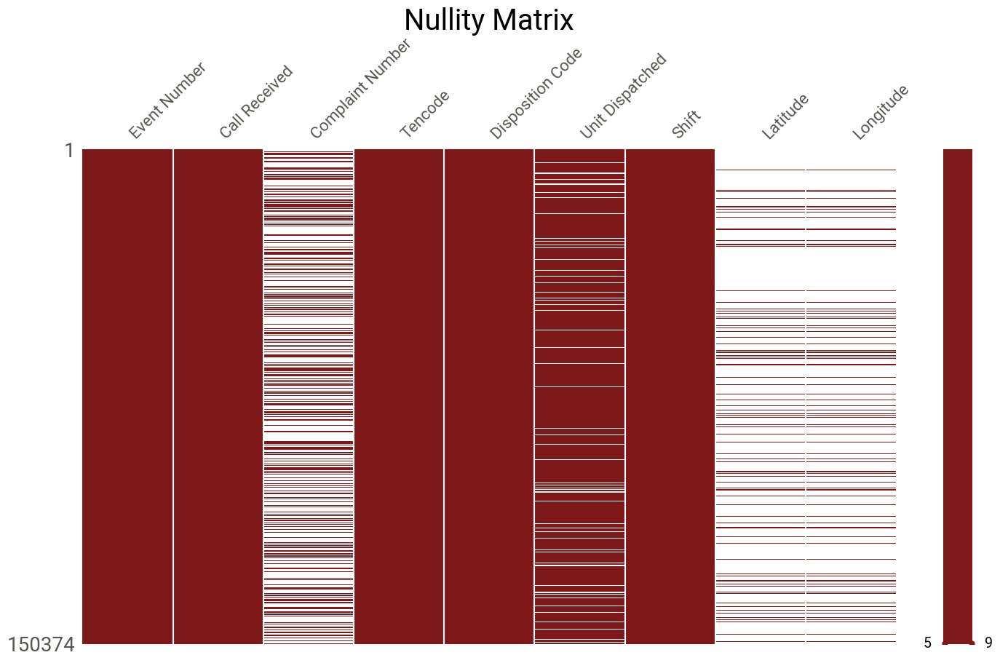

In [6]:
helper_functions.nullity_matrix(df, DF_TITLE, PLOT_COLOR)

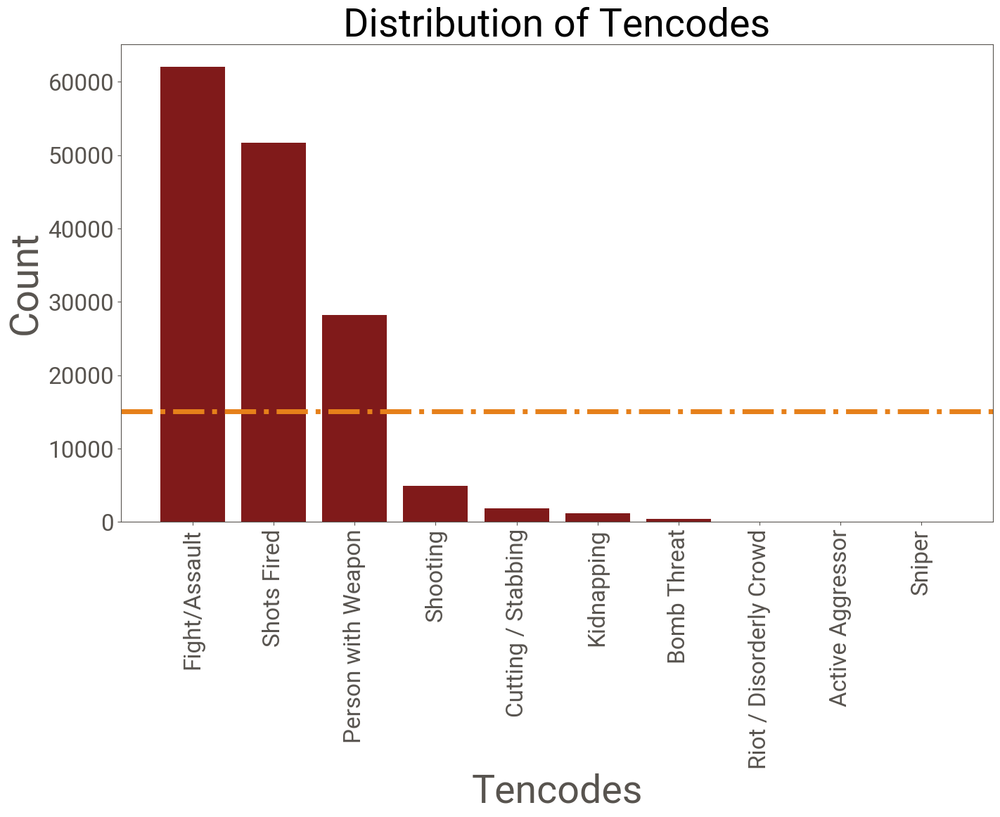

In [12]:
x_tick_labels = ['Fight/Assault', 'Shots Fired', 'Person with Weapon', 'Shooting',
                 'Cutting / Stabbing', 'Kidnapping', 'Bomb Threat', 'Riot / Disorderly Crowd',
                 'Active Aggressor', 'Sniper']

helper_functions.make_bar_plot(df, 'Tencode', x_tick_labels,'Distribution of Tencodes', DF_TITLE, 'Count', 'Tencodes', PLOT_COLOR)

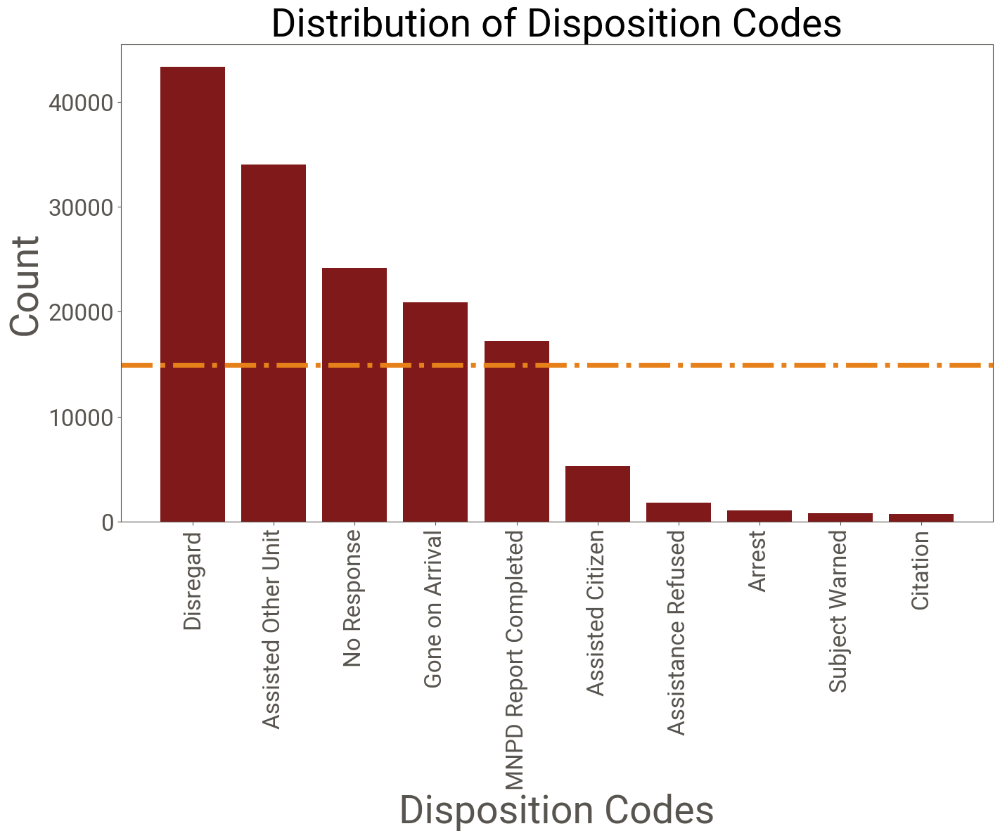

In [17]:
x_tick_labels = ['Disregard', 'Assisted Other Unit', 'No Response', 'Gone on Arrival', 'MNPD Report Completed',
                 'Assisted Citizen', 'Assistance Refused', 'Arrest', 'Subject Warned', 'Citation']

helper_functions.make_bar_plot(df, 'Disposition Code', x_tick_labels, 'Distribution of Disposition Codes', DF_TITLE,
                               'Count', 'Disposition Codes', PLOT_COLOR, limit=10)

In [18]:
%%capture --no-display

helper_functions.map_plot(df, DF_TITLE)

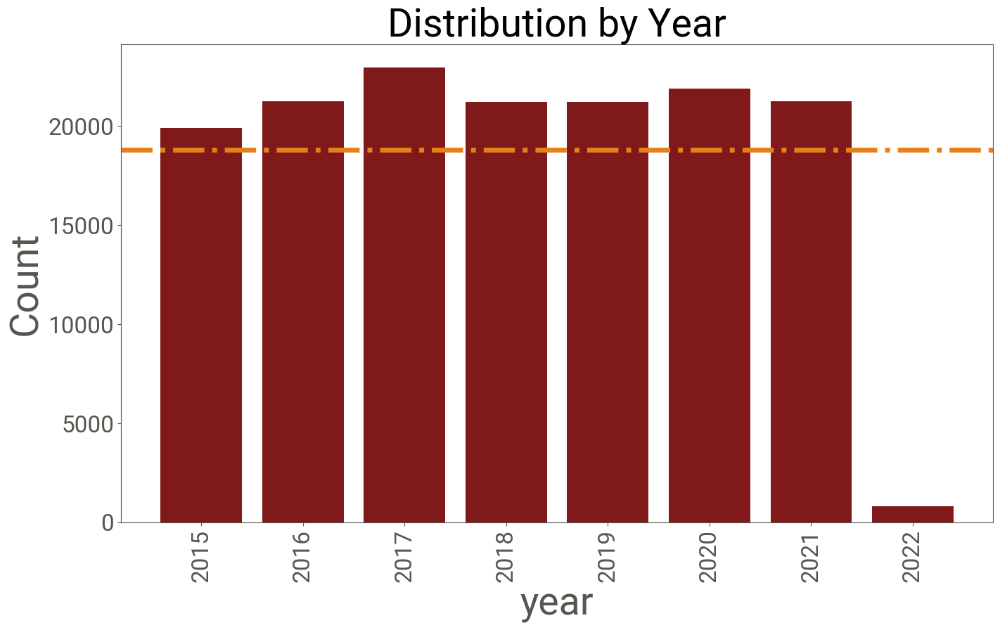

In [22]:
helper_functions.make_dt_bar_plot(df, 'Distribution by ', DF_TITLE, 'Count', 'year', PLOT_COLOR)

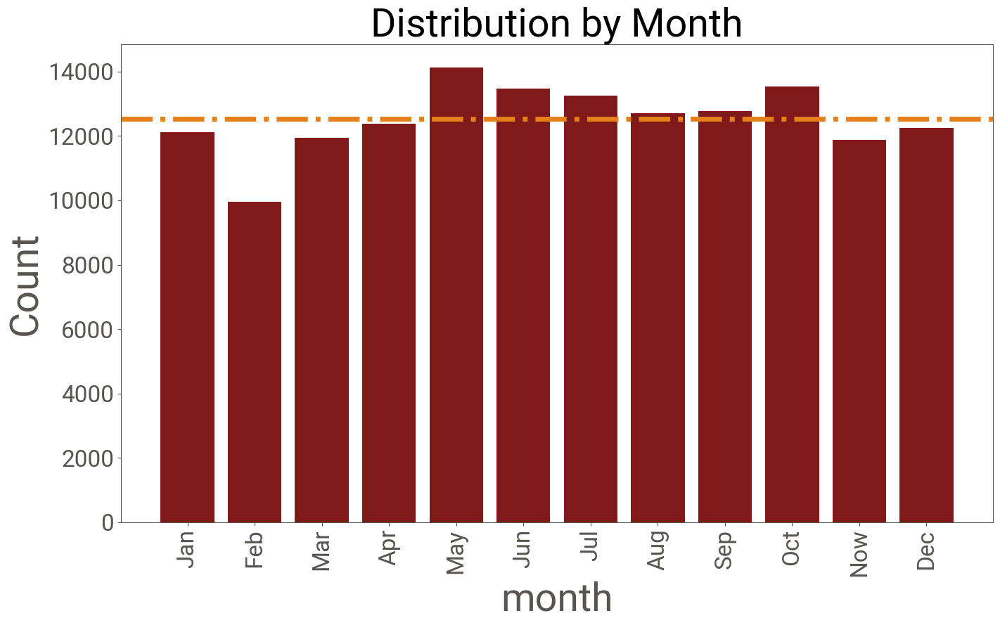

In [20]:
helper_functions.make_dt_bar_plot(df, 'Distribution by ', DF_TITLE, 'Count', 'month', PLOT_COLOR)

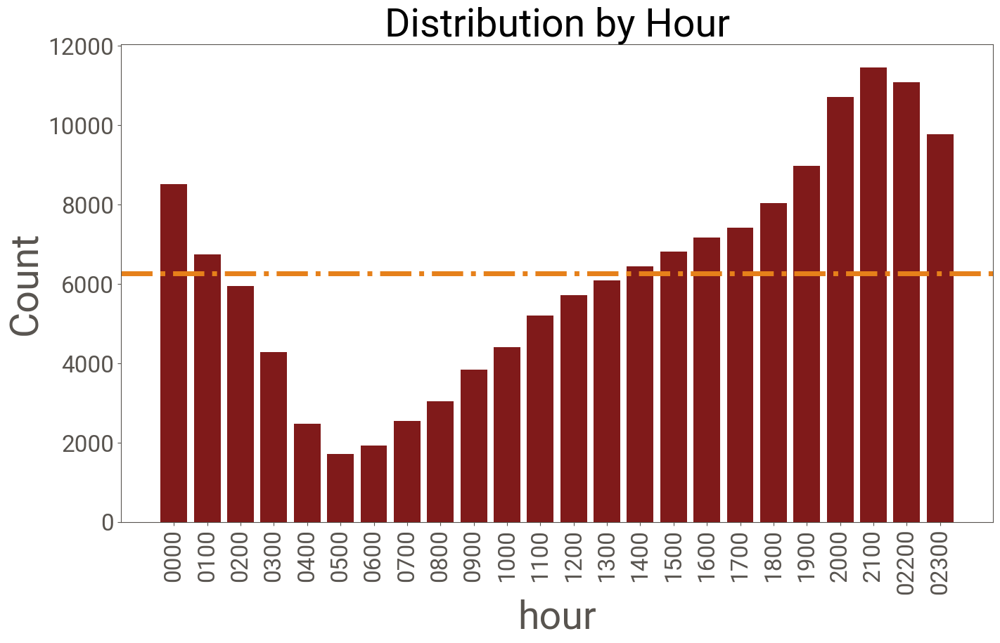

In [21]:
helper_functions.make_dt_bar_plot(df, 'Distribution by ', DF_TITLE, 'Count', 'hour', PLOT_COLOR)